# Blurring and Smoothing

Smoothing an image can help get rid of noise, or help an application focus on general details.

Often blurring and smoothing is combined with edge detection. Edge detection algorithms detect too many edges when shown a high resolution image without any blurring.

### Some methods of image blurring and smoothing
- Gamma Correction: This can be applied to an image to make it appear brighter or darker depending on the Gamma value chosen.
- Kernel based filters: Kernels can be applied over an image to produce a variety effect. Visualize it [here](http://setosa.io/ev/image-kernels/)

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline

In [3]:
def load_img():
    img = cv2.imread('../DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
load_img()

array([[[0.78431374, 0.7882353 , 0.80784315],
        [0.7529412 , 0.77254903, 0.79607844],
        [0.7254902 , 0.7647059 , 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8784314 , 0.88235295, 0.9019608 ],
        [0.7647059 , 0.78431374, 0.80784315],
        [0.7019608 , 0.7529412 , 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.85490197, 0.8666667 , 0.89411765],
        [0.6509804 , 0.6784314 , 0.70980394],
        [0.4862745 , 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

In [5]:
def display_img(img):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

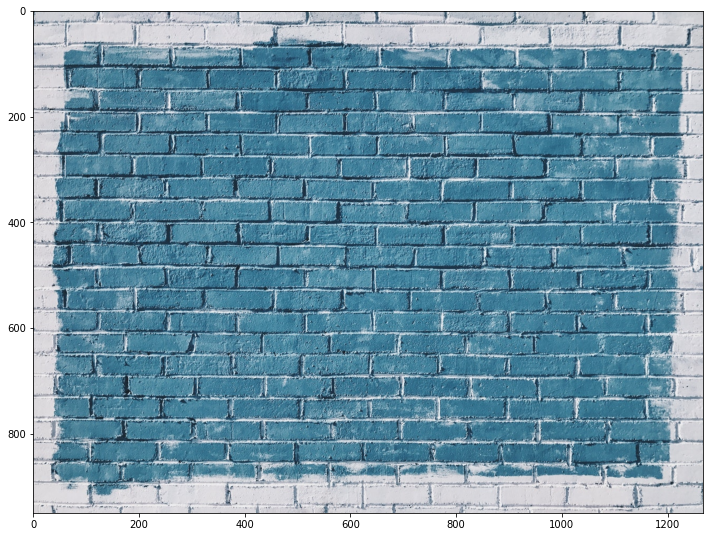

In [8]:
img = load_img()
display_img(img)

In [9]:
# GAMMA CORRECTION
# Gamma values less than 1 makes the image lighter. Gamma values above 1 makes the image darker.
gamma = 1 / 4

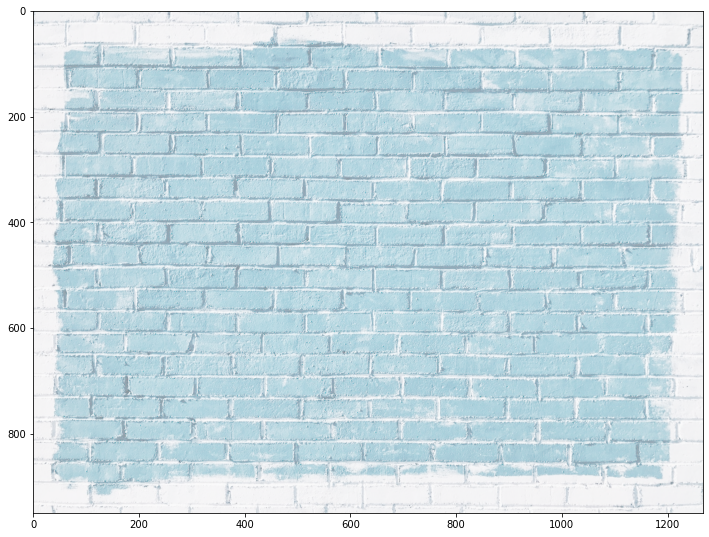

In [10]:
result = np.power(img, gamma)
display_img(result)

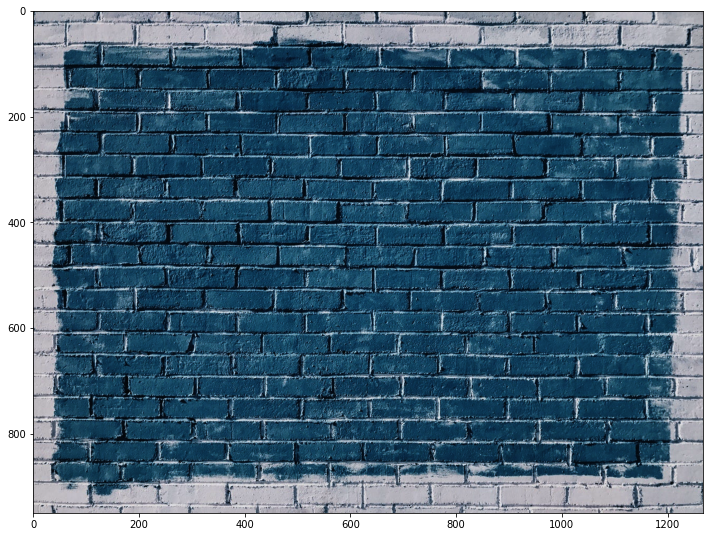

In [11]:
gamma = 2
result = np.power(img, gamma)
display_img(result)

In [18]:
def get_image():
    img = load_img()
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(img, text='bricks', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=4)
    return img


img = get_image()
img

array([[[0.78431374, 0.7882353 , 0.80784315],
        [0.7529412 , 0.77254903, 0.79607844],
        [0.7254902 , 0.7647059 , 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8784314 , 0.88235295, 0.9019608 ],
        [0.7647059 , 0.78431374, 0.80784315],
        [0.7019608 , 0.7529412 , 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.85490197, 0.8666667 , 0.89411765],
        [0.6509804 , 0.6784314 , 0.70980394],
        [0.4862745 , 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


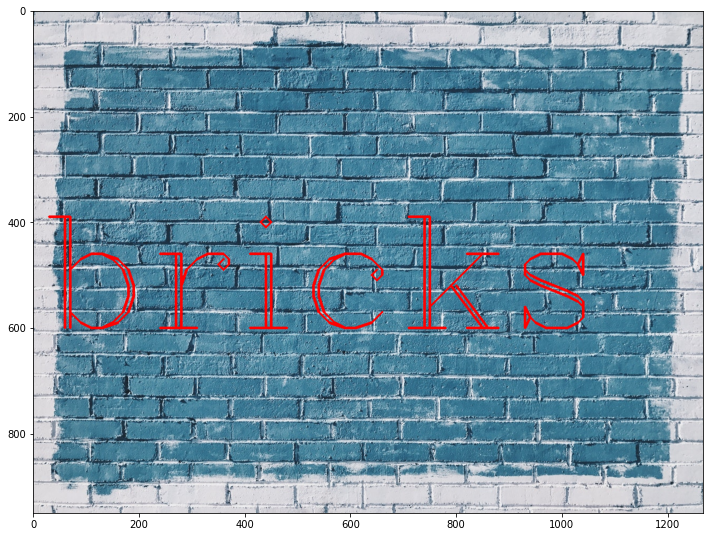

In [13]:
display_img(img)

In [14]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25

In [15]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


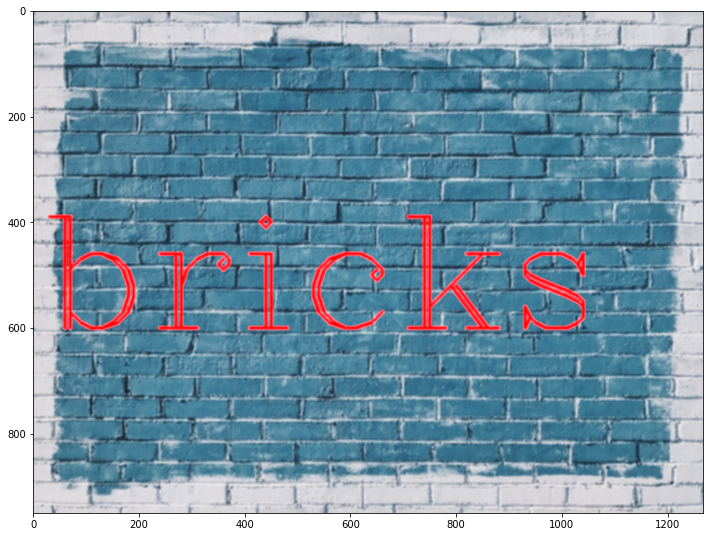

In [16]:
dst = cv2.filter2D(img, -1, kernel)
display_img(dst)

In [19]:
img = get_image()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


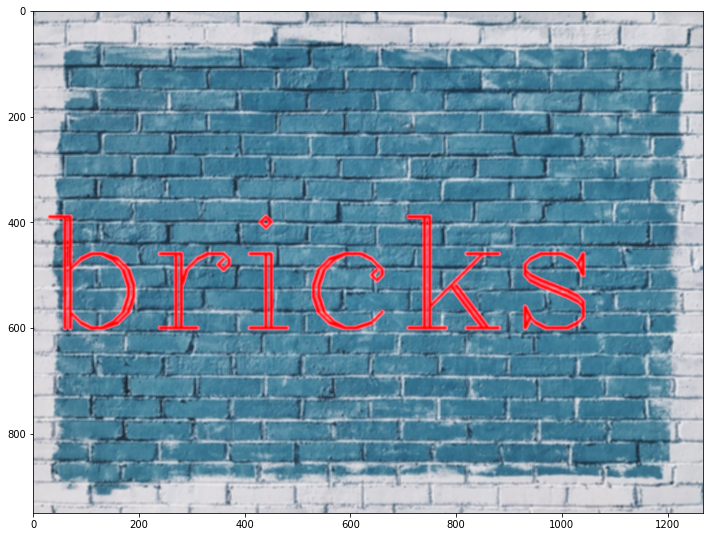

In [20]:
blurred = cv2.blur(img, ksize=(5, 5))
display_img(blurred)

In [21]:
img = get_image()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


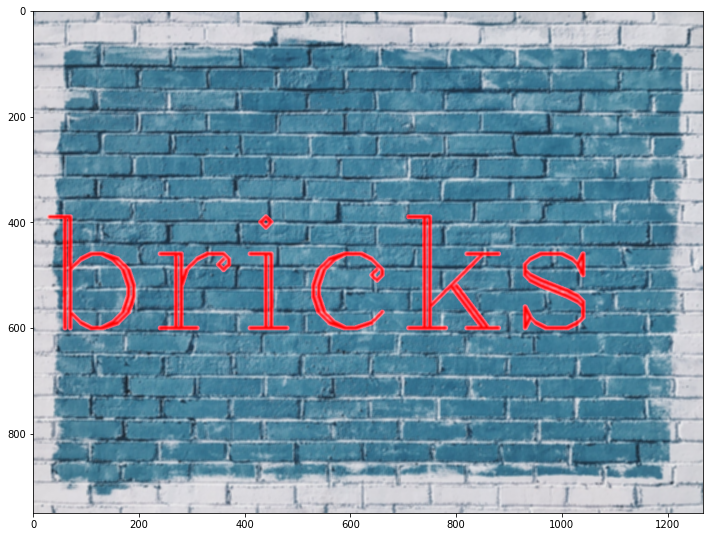

In [22]:
blurred_img = cv2.GaussianBlur(img, (5, 5), 10)
display_img(blurred_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


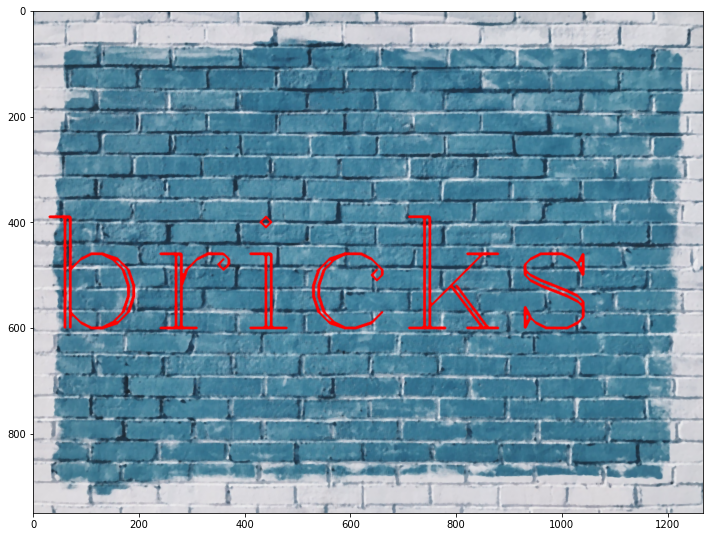

In [23]:
median_result = cv2.medianBlur(img, 5)
display_img(median_result)

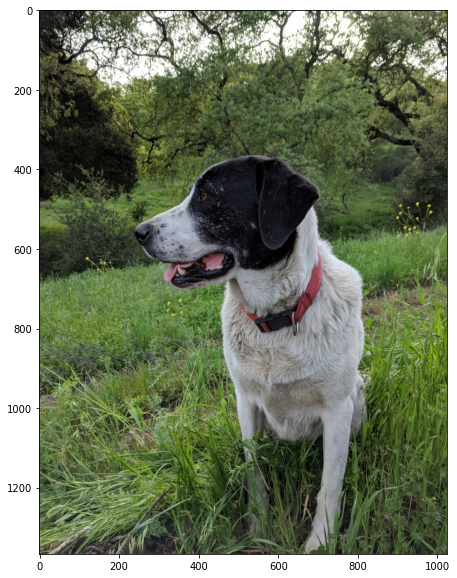

In [26]:
img = cv2.imread('../DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img(img)

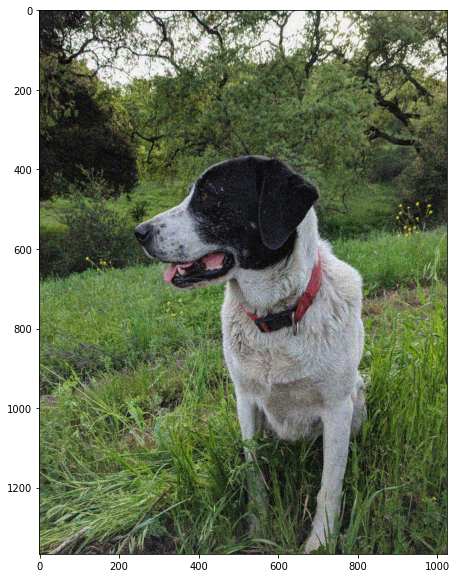

In [25]:
noise_img = cv2.imread('../DATA/sammy_noise.jpg')
display_img(noise_img)

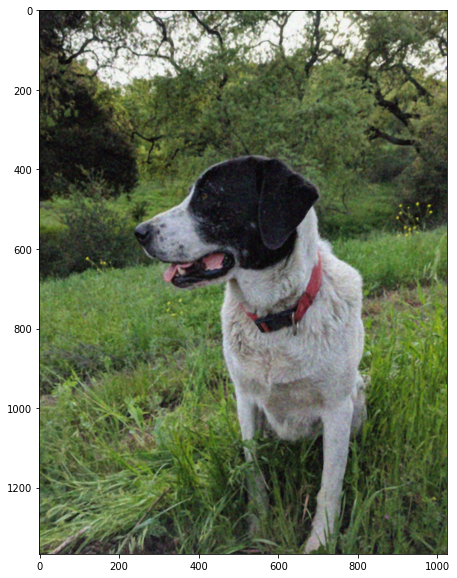

In [27]:
median = cv2.medianBlur(noise_img, 5)
display_img(median)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


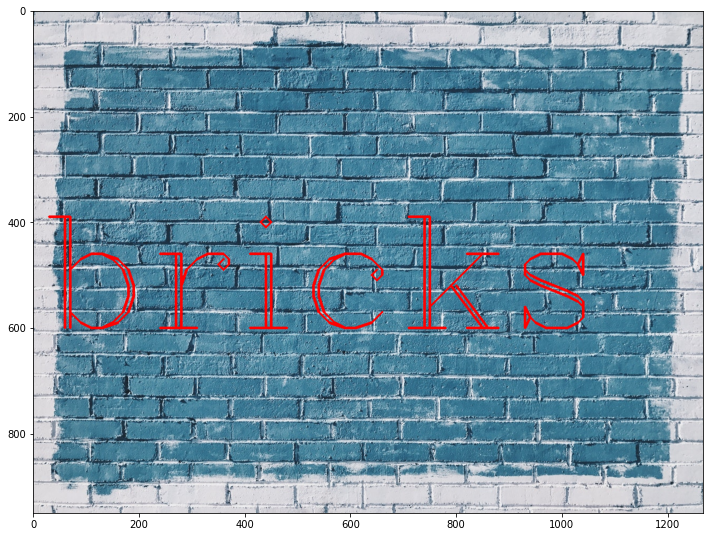

In [28]:
img = get_image()
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


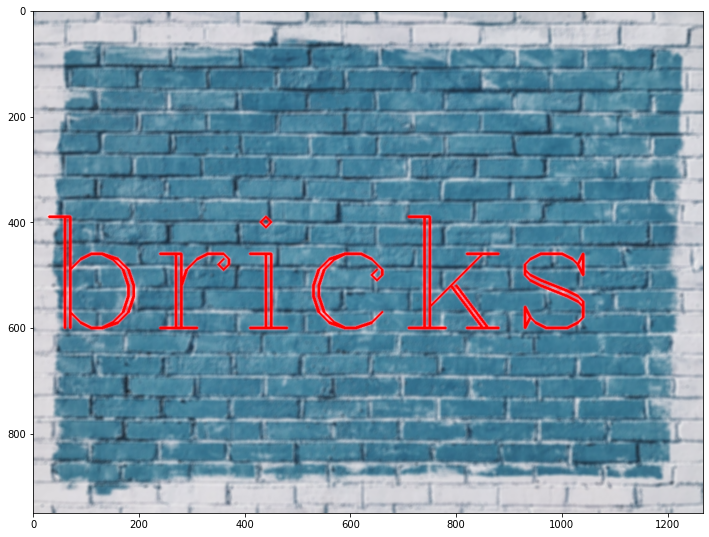

In [29]:
blur = cv2.bilateralFilter(img, 9, 75, 75)
display_img(blur)